In [97]:
from scripts.db import *
from scripts.plots import *
from scripts.stats import *
import numpy as np  
import pandas as pd  
import matplotlib.pyplot as plt  
%matplotlib inline
from sklearn import linear_model
import os
import json

In [187]:
users, db = dataProcesada(filtroCompletadoActivo=False)

In [188]:
data = db
data = data[['alias', 'userId', 'EnvioInstance','Finalizado', 'OrientacionEntrenamiento', 'Refrencia', 'faseActiva','identificadorNivel', 'levelInstance', 'sessionInstance', 'AnguloFijo','Desviacion', 'IdEstimulo', 'NivelSenalDinamica', 'NivelSenalEstimulo', 'RtaCorrecta','TipoDeTrial']]
data = data[data['faseActiva']!='Tutorial']


mapNames = {'ExpT_Marco':'Sujeto01','ExpT_Carolina':'Sujeto02','ExpT_Magdalena':'Sujeto03','ExpT_Ivan':'Sujeto04','ExpT_Enzo':'Sujeto05',
            'ExpT_Julieta':'Sujeto06','ExpT_Gaston':'Sujeto07','ExpT_Andres':'Sujeto08','ExpT_CaroG':'Sujeto09','ExpT_Michelle':'Sujeto10'}

data['sujetos'] = data['alias'].map(mapNames)
#Datos perdidos
# Carolina primer test entrenamiento
# Magdalena primer entrenamiento ultimo dia
# Enzo primero del segundo dia

Vamos a hacer un analisis sujeto por sujeto

In [190]:
# Extraemos la info relevante
db = data[data['identificadorNivel']=='TESTP30']
db = db.drop(['alias','userId','identificadorNivel','EnvioInstance','Finalizado','Refrencia','levelInstance','sessionInstance','AnguloFijo','Desviacion','IdEstimulo','NivelSenalEstimulo','TipoDeTrial'], axis=1)

#Reajustamos los datos
AMax = 79.6
N = 200
paso=AMax/N
db['medida'] = (db['NivelSenalDinamica']+1)*paso



In [178]:
from statsmodels.formula.api import ols
import statsmodels.api as sm
dbLinda = db.copy()
del dbLinda['NivelSenalDinamica']
#dbLinda.loc[dbLinda["sujetos"]=="Sujeto03", "OrientacionEntrenamiento"] = "P30"
dbLinda = dbLinda.rename(columns={'faseActiva': 'Stage'})
dbLinda['Stage'] = dbLinda['Stage'].map(lambda x: "Pre" if x=='TestInicial' else "Post")
dbLinda['Entrenado'] = dbLinda['sujetos'].map(lambda x: 1 if x in ['Sujeto03', 'Sujeto04', 'Sujeto05'] else 0)
dbLinda['RtaCorrecta'] = dbLinda['RtaCorrecta'].astype(float)
#dbLinda['Trial'] = list(range(40))*20
#dbLinda = dbLinda[dbLinda['Trial']>30]

dbLinda.head()

lm = ols('RtaCorrecta ~ medida + Entrenado', data=dbLinda[dbLinda['Stage']=='Pre']).fit()
print (lm.summary())

lm = ols('RtaCorrecta ~ medida + Entrenado', data=dbLinda[dbLinda['Stage']=='Post']).fit()
print (lm.summary())


#lm = ols('RtaCorrecta ~ Stage + Entrenado:Stage', data=dbLinda).fit()
#lm.summary()

                            OLS Regression Results                            
Dep. Variable:            RtaCorrecta   R-squared:                       0.027
Model:                            OLS   Adj. R-squared:                  0.022
Method:                 Least Squares   F-statistic:                     5.574
Date:                Mon, 26 Dec 2016   Prob (F-statistic):            0.00410
Time:                        17:15:33   Log-Likelihood:                -237.23
No. Observations:                 400   AIC:                             480.5
Df Residuals:                     397   BIC:                             492.4
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [95.0% Conf. Int.]
------------------------------------------------------------------------------
Intercept      0.5622      0.056      9.978      0.0

In [63]:
Dificultad = np.array(dbLinda["medida"])[:, np.newaxis]
Cte = np.array(dbLinda["Cte"])[:, np.newaxis]
Pre = np.array(dbLinda["PrePost"])[:, np.newaxis]
Entrenado = np.array(dbLinda["Entrenado"])[:, np.newaxis]
Condicion = np.array(dbLinda["Condicion"])[:, np.newaxis]

X = np.concatenate((Dificultad,Cte,Pre,Entrenado,Condicion),axis=1)
y = np.array(dbLinda["RtaCorrecta"].astype(float))[:, np.newaxis]



In [203]:
len (db[db['sujetos']=='Sujeto10'])

80

In [198]:
db[db['sujetos']=='Sujeto05']

,OrientacionEntrenamiento,faseActiva,NivelSenalDinamica,RtaCorrecta,sujetos,medida
7049,P30,TestInicial,199,True,Sujeto05,79.600
7050,P30,TestInicial,153,True,Sujeto05,61.292
7051,P30,TestInicial,111,True,Sujeto05,44.576
7052,P30,TestInicial,73,True,Sujeto05,29.452
7053,P30,TestInicial,73,False,Sujeto05,29.452
7054,P30,TestInicial,103,True,Sujeto05,41.392
7055,P30,TestInicial,78,True,Sujeto05,31.442
7056,P30,TestInicial,57,False,Sujeto05,23.084
7057,P30,TestInicial,74,True,Sujeto05,29.850
7058,P30,TestInicial,61,False,Sujeto05,24.676


In [92]:
from sklearn import linear_model
from scipy import stats
import numpy as np
import random


class LinearRegressionNueva(linear_model.LogisticRegression):
    """
    LinearRegression class after sklearn's, but calculate t-statistics
    and p-values for model coefficients (betas).
    Additional attributes available after .fit()
    are `t` and `p` which are of the shape (y.shape[1], X.shape[1])
    which is (n_features, n_coefs)
    This class sets the intercept to 0 by default, since usually we include it
    in X.
    """

    def __init__(self, *args, **kwargs):
        if not "fit_intercept" in kwargs:
            kwargs['fit_intercept'] = False
        super(LinearRegressionNueva, self)\
                .__init__(*args, **kwargs)

    def fit(self, X, y, n_jobs=1):
        self = super(LinearRegressionNueva, self).fit(X, y, n_jobs)

        sse = np.sum((self.predict(X) - y) ** 2, axis=0) / float(X.shape[0] - X.shape[1])
#         se = np.array([np.sqrt(np.diagonal(sse * np.linalg.inv(np.dot(X.T, X))))])
        se = np.array([
            np.sqrt(np.diagonal(sse[i] * np.linalg.inv(np.dot(X.T, X))))
                                                    for i in range(sse.shape[0])
                    ])

        self.t = self.coef_ / se
        self.p = 2 * (1 - stats.t.cdf(np.abs(self.t), y.shape[0] - X.shape[1]))
        return self
    
    
    
def model(x):
    return 1 / (1 + np.exp(-x))

def decision(probability):
    return random.random() < probability


# X = np.arange(-3,3,0.01)
# #dist_p = model(X+3)
# #y = [decision(p) for p in dist_p]
# dist_p = model(X)
# y = y + [decision(p) for p in dist_p]
# y = np.array(y)[:, np.newaxis]
# #X = np.concatenate((X,X),axis=0)
# X = X[:, np.newaxis]
# #condicion = [1]*60000+[0]*60000
# #condicion = np.array(condicion)[:, np.newaxis]
# constante = [1]*60000
# constante = np.array(constante)[:, np.newaxis]
# #X = np.concatenate((X), axis = 1)
# clf = LinearRegression()
# clf.fit(X, y)
# loss = model(X * clf.coef_ + clf.intercept_).ravel()

[[ 1.01126565]]
[ 0.02882306]
[  4.53978687e-05   4.54432872e-05   4.54887512e-05 ...,   9.99954466e-01
   9.99954511e-01   9.99954557e-01]


/home/ionatan/.local/lib/python3.4/site-packages/sklearn/utils/validation.py:526: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


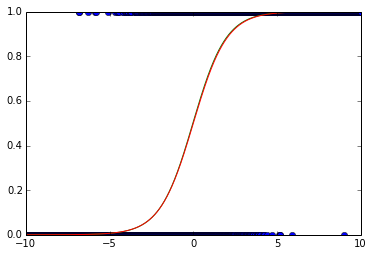

In [95]:
%matplotlib inline
import matplotlib.pyplot as plt

X = np.arange(-10,10,0.001)
dist_p = model(X)
y = [decision(p) for p in dist_p]
y = np.array(y)[:, np.newaxis]
X = X[:, np.newaxis]
clf = linear_model.LogisticRegression(C=1e5)
#clf = LinearRegressionNueva()
#clf = linear_model.LinearRegression(fit_intercept=True)
clf.fit(X, y)
loss = model(X * clf.coef_ + clf.intercept_).ravel()
print (clf.coef_)
print (clf.intercept_)
#print (clf.p)
#print (clf.t)
#print(X)
print(dist_p)
plt.plot(X, y, "o")
plt.plot(X, loss)
plt.plot(X, dist_p)

In [94]:
X

array([[-10.   ],
       [ -9.999],
       [ -9.998],
       ..., 
       [  9.997],
       [  9.998],
       [  9.999]])

/usr/lib/python3/dist-packages/matplotlib/collections.py:549: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == 'face':
/usr/lib/python3/dist-packages/matplotlib/pyplot.py:412: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_num_figures`).
  max_open_warning, RuntimeWarning)


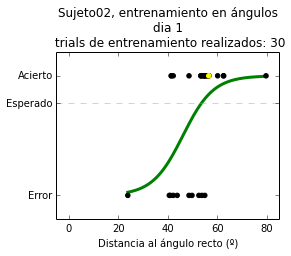

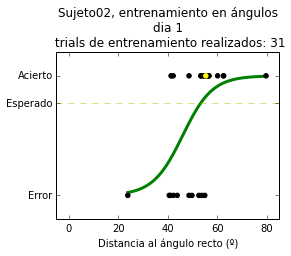

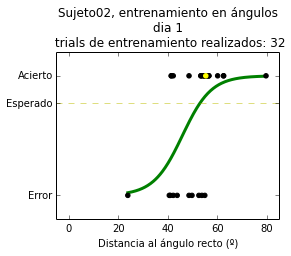

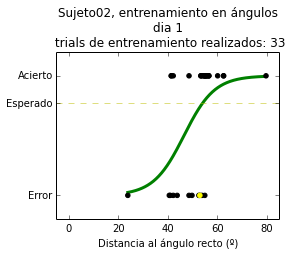

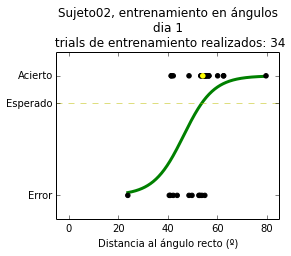

...

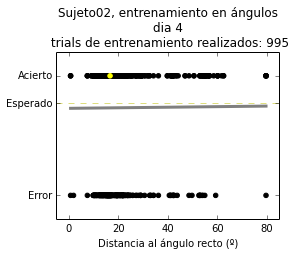

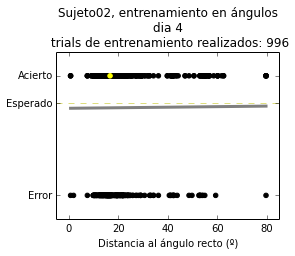

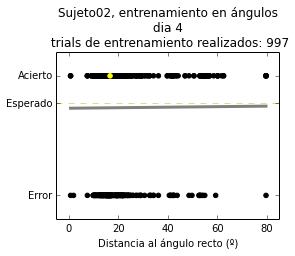

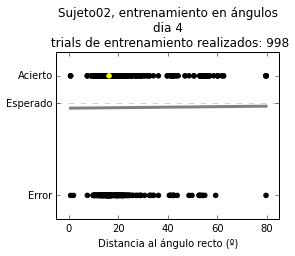

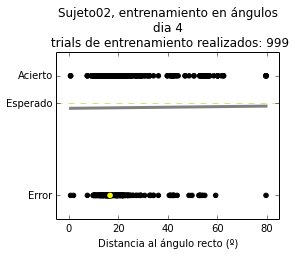

In [28]:
mapColor = {'TestInicial':'black', 'Entrenamiento1':'green', 'Entrenamiento2':'red', 'Entrenamiento3':'blue',
       'Entrenamiento4':'gray', 'TestFinal':'black'}


vmin=30

ventana = -1

TestInicial = False
TestFinal = False

if TestInicial:
    inicio=0
else:
    inicio = 40
    
if TestFinal:
    final=len(dataConjunta)
else:
    final=len(dataConjunta)-40



def model(x):
    return 1 / (1 + np.exp(-x))

j=0
for i in np.arange(inicio,final):
    
    if ventana < 0:
        if i-inicio<vmin:
            continue
        else:
            Ni=inicio
            Nf=i
    else:
        if i-ventana < inicio:
            continue
        else:
            Ni=i-ventana
            Nf=i
    
    
    
    X = np.array(dataConjunta["medida"])[Ni:Nf, np.newaxis]
    y = np.array(dataConjunta["RtaCorrecta"].astype(float))[Ni:Nf]

    sinDatos=False
    if ventana>0:
        if 0 in X:
            continue
    else:
        if X[-1] == 0:
            sinDatos = True
        X =  [elementofiltrado[0] for elementofiltrado in [elemento for elemento in zip(X,y) if elemento[0]!=0]]
        y =  [elementofiltrado[1] for elementofiltrado in [elemento for elemento in zip(X,y) if elemento[0]!=0]]
        
    
    clf = linear_model.LogisticRegression(C=1e5)
    clf.fit(X, y)

    # and plot the result
    fig, ax = plt.subplots(1,1,figsize=(4, 3))
    ax.set_xlim([-5,85])
    if ventana>0:
        ax.set_title(dataConjunta.iloc[0]['sujetos']+', entrenamiento en ángulos \n' + 'dia '+dataConjunta['faseActiva'].iloc[Nf-1][-1]+'\n trials de entrenamiento realizados: '+ str(Nf-40)+' \n ajuste considerando los últimos '+str(ventana))
    else:
        ax.set_title(dataConjunta.iloc[0]['sujetos']+', entrenamiento en ángulos \n' + 'dia '+dataConjunta['faseActiva'].iloc[Nf-1][-1]+'\n trials de entrenamiento realizados: '+ str(Nf-40))
    ax.scatter(X, y, color='black', zorder=20)
    ax.scatter(X[-1], y[-1], color='yellow', zorder=20)
    X_test = np.linspace(min(X), max(X), 300)

    loss = model(X_test * clf.coef_ + clf.intercept_).ravel()
    ax.plot(X_test, loss, color=mapColor[dataConjunta['faseActiva'].iloc[Nf-1]], linewidth=3)

    ax.axhline(y=0.77,linewidth=0.5, color='y', linestyle='dashed')
    ax.set_xlabel('Distancia al ángulo recto (º)')
    ax.set_yticks([0,0.77,1]) 
    ax.set_yticklabels(['Error','Esperado','Acierto'])
    if sinDatos:
        ax.text(40,0.5,'Sin datos para este trial', ha='center')
    
    directory = './Series/'+dataConjunta.iloc[0]['sujetos']+'_ventana_'+str(ventana)+'rango:'
    if not os.path.exists(directory):
        os.makedirs(directory)
    plt.savefig(directory+'/img'+str(j)+'.png', dpi=300, bbox_inches='tight')
    j = j+1
    #break

In [31]:
if ventana:
    print (True)
else:
    print (False)
        

True


In [26]:
clf.predict_proba(X)
x = np.arange(0,80)[:, np.newaxis]
resultado = clf.predict_proba(x)

len (resultado)

80

In [42]:
min(X)

array([ 42.984])

In [88]:
dataPrueba = data[data['alias']=='ExpT_Carolina']
pepe = dataPrueba[dataPrueba['levelInstance']==1472738524843]

In [93]:
pepe

,alias,userId,EnvioInstance,Finalizado,OrientacionEntrenamiento,Refrencia,faseActiva,identificadorNivel,levelInstance,sessionInstance,AnguloFijo,Desviacion,IdEstimulo,NivelSenalDinamica,NivelSenalEstimulo,RtaCorrecta,TipoDeTrial,sujetos
680,ExpT_Carolina,1472735163595,1472739152992,False,A30,30,Entrenamiento1,ENTRENAMIENTOA30INICIAL,1472738524843,1472735915319,32.5,-169.605,570,199,200,True,Estimulo,Sujeto02
681,ExpT_Carolina,1472735163595,1472739152992,False,A30,30,Entrenamiento1,ENTRENAMIENTOA30INICIAL,1472738524843,1472735915319,32.5,-29.750,920,150,151,True,Estimulo,Sujeto02
682,ExpT_Carolina,1472735163595,1472739152992,False,A30,30,Entrenamiento1,ENTRENAMIENTOA30INICIAL,1472738524843,1472735915319,35.0,-169.605,1370,103,200,True,Test,Sujeto02
683,ExpT_Carolina,1472735163595,1472739152992,False,A30,30,Entrenamiento1,ENTRENAMIENTOA30INICIAL,1472738524843,1472735915319,25.0,-131.685,1866,103,104,True,Estimulo,Sujeto02
684,ExpT_Carolina,1472735163595,1472739152992,False,A30,30,Entrenamiento1,ENTRENAMIENTOA30INICIAL,1472738524843,1472735915319,23.0,-90.000,8184,59,0,False,NoEstimulo,Sujeto02
685,ExpT_Carolina,1472735163595,1472739152992,False,A30,30,Entrenamiento1,ENTRENAMIENTOA30INICIAL,1472738524843,1472735915319,32.5,-130.895,668,101,102,False,Estimulo,Sujeto02
686,ExpT_Carolina,1472735163595,1472739152992,False,A30,30,Entrenamiento1,ENTRENAMIENTOA30INICIAL,1472738524843,1472735915319,30.0,-146.695,228,141,142,True,Estimulo,Sujeto02
687,ExpT_Carolina,1472735163595,1472739152992,False,A30,30,Entrenamiento1,ENTRENAMIENTOA30INICIAL,1472738524843,1472735915319,36.0,-90.000,8181,102,0,False,NoEstimulo,Sujeto02
688,ExpT_Carolina,1472735163595,1472739152992,False,A30,30,Entrenamiento1,ENTRENAMIENTOA30INICIAL,1472738524843,1472735915319,30.0,-90.000,8170,139,0,True,NoEstimulo,Sujeto02
689,ExpT_Carolina,1472735163595,1472739152992,False,A30,30,Entrenamiento1,ENTRENAMIENTOA30INICIAL,1472738524843,1472735915319,30.0,-145.905,230,139,140,True,Estimulo,Sujeto02
